In [1]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [2]:
! kaggle competitions download uw-madison-gi-tract-image-segmentation

uw-madison-gi-tract-image-segmentation.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
! unzip /content/uw-madison-gi-tract-image-segmentation.zip

In [4]:
! pip install monai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
import numpy as np
import pandas as pd
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as tv_models
import matplotlib.pyplot as plt
import seaborn as sns
import cv2, torch, tqdm, os, torchvision, gc, warnings, random
from torchvision.models.resnet import ResNet, BasicBlock, Bottleneck
from torch.utils.data import Dataset, DataLoader
from monai.metrics import compute_hausdorff_distance

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
torch.autograd.set_detect_anomaly(True)

In [6]:
data_df_path = '/content/train.csv'
data_df = pd.read_csv(data_df_path)
data_df.head()

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN


In [7]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115488 entries, 0 to 115487
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            115488 non-null  object
 1   class         115488 non-null  object
 2   segmentation  33913 non-null   object
dtypes: object(3)
memory usage: 2.6+ MB


In [8]:
def long_to_wide(df):
    df = df.pivot(index='id', columns='class', values='segmentation')
    df['id'] = df.index
    df.index = [i for i in range(len(df))]
    return df

data_df = long_to_wide(data_df)
data_df.head()

class,large_bowel,small_bowel,stomach,id
0,NaN,NaN,NaN,case101_day20_slice_0001
1,NaN,NaN,NaN,case101_day20_slice_0002
2,NaN,NaN,NaN,case101_day20_slice_0003
3,NaN,NaN,NaN,case101_day20_slice_0004
4,NaN,NaN,NaN,case101_day20_slice_0005


In [9]:
def get_info_from_path(path):
    case_day, filname = path.rsplit("/", maxsplit=3)[1::2]
    case, day = case_day.split('_')
    case_slice = filname.split('_')[0:2]
    case_slice = '_'.join(case_slice)
    img_id = '_'.join([case_day, case_slice])

    case = case.replace('case', '')
    day = day.replace('day', '')
    slice_no, width, height = filname.split('_')[1:4]
    
    return img_id, case, day, slice_no, width, height


def get_file_names(root_path: str, ext='.png'):
    image_paths = []
    image_properties = []
    for path, subdirs, files in tqdm.tqdm(os.walk(root_path)):
        for name in files:
            img_path = os.path.join(path, name)
            image_paths.append(img_path)
            properties = list(get_info_from_path(img_path))
            image_properties.append(properties)
                        
    return image_paths, image_properties

training_data_path = '/content/train'
image_paths, image_properties = get_file_names(training_data_path)

634it [00:00, 2435.74it/s]


In [10]:
image_properties = np.array(image_properties)

img_df = pd.DataFrame()

img_df['id'] = image_properties[:, 0]
img_df['case'] = image_properties[:, 1].astype(int)
img_df['day'] = image_properties[:, 2].astype(int)
img_df['slice'] = image_properties[:, 3].astype(int)
img_df['width'] = image_properties[:, 4].astype(int)
img_df['height'] = image_properties[:, 5].astype(int)
img_df['path'] = image_paths

img_df.head()

,id,case,day,slice,width,height,path
0,case113_day16_slice_0129,113,16,129,360,310,/content/train/case113/case113_day16/scans/sli...
1,case113_day16_slice_0035,113,16,35,360,310,/content/train/case113/case113_day16/scans/sli...
2,case113_day16_slice_0032,113,16,32,360,310,/content/train/case113/case113_day16/scans/sli...
3,case113_day16_slice_0055,113,16,55,360,310,/content/train/case113/case113_day16/scans/sli...
4,case113_day16_slice_0058,113,16,58,360,310,/content/train/case113/case113_day16/scans/sli...


In [11]:
data_df = data_df.merge(img_df, on='id', how='outer')
id_column = data_df.pop('id')
data_df.insert(0, 'id', id_column)

data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case101_day20_slice_0001,NaN,NaN,NaN,101,20,1,266,266,/content/train/case101/case101_day20/scans/sli...
1,case101_day20_slice_0002,NaN,NaN,NaN,101,20,2,266,266,/content/train/case101/case101_day20/scans/sli...
2,case101_day20_slice_0003,NaN,NaN,NaN,101,20,3,266,266,/content/train/case101/case101_day20/scans/sli...
3,case101_day20_slice_0004,NaN,NaN,NaN,101,20,4,266,266,/content/train/case101/case101_day20/scans/sli...
4,case101_day20_slice_0005,NaN,NaN,NaN,101,20,5,266,266,/content/train/case101/case101_day20/scans/sli...


In [12]:
lb_seg = data_df.large_bowel[94]
sb_seg = data_df.small_bowel[94]
stomach_seg = data_df.stomach[94]

print(
    f'tumor on large bowel mask\n: {lb_seg} \n\n', 
    f'tumor on small bowel mask\n: {sb_seg} \n\n',
    f'tumor on stomach mask\n: {stomach_seg} \n\n')

tumor on large bowel mask
: 24153 7 24417 11 24682 14 24948 14 25213 16 25479 17 25744 19 26009 21 26275 21 26540 23 26805 24 27071 24 27337 24 27603 24 27869 23 28135 23 28401 23 28667 22 28934 20 29052 6 29201 17 29317 9 29468 13 29582 11 29735 9 29848 11 30002 6 30114 12 30380 12 30544 14 30646 13 30809 16 30912 13 31074 18 31178 14 31339 19 31444 14 31605 19 31710 14 31871 20 31976 14 32137 20 32242 15 32403 19 32507 16 32669 19 32773 16 32935 19 33039 16 33201 19 33304 17 33467 19 33570 17 33734 18 33836 17 34001 17 34101 18 34268 15 34367 19 34536 13 34633 19 34803 11 34898 20 35071 9 35163 21 35338 7 35429 21 35694 22 35960 22 36225 22 36491 22 36755 24 37020 25 37286 24 37551 24 37816 25 38082 24 38347 24 38613 23 38879 23 39145 22 39411 22 39677 21 39943 21 40209 20 40476 18 40742 18 41008 17 41275 15 41541 15 41808 13 42075 11 42343 7 

 tumor on small bowel mask
: 26184 4 26449 7 26715 8 26980 11 27245 14 27510 19 27775 21 28041 21 28306 21 28571 21 28837 19 29103 18 29368 1

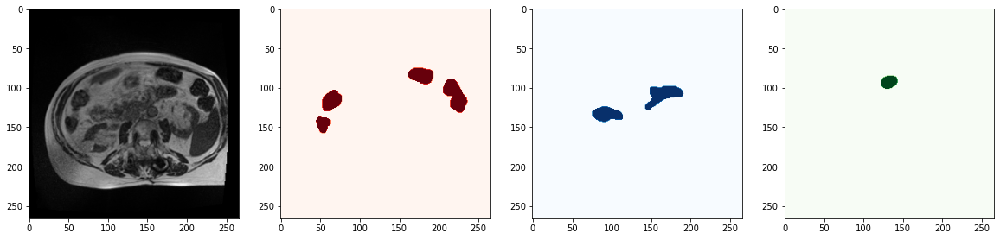

In [13]:
def rle2mask(img_shape, rle):
    #correct order: (H, W)
    H, W = img_shape
    
    rle = rle.split()
    start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
    end_idx = start_idx + (lengths - 1)
    
    mask = np.zeros(H*W, dtype=np.int8)

    for start, end in zip(start_idx, end_idx):
        mask[start:end] = 1

    mask = mask.reshape(H, W)
    return mask


idx = 99
sample_path = data_df.path[idx]
lb_seg = data_df.large_bowel[idx]
sb_seg = data_df.small_bowel[idx]
stomach_seg = data_df.stomach[idx]

sample_img = cv2.imread(sample_path, cv2.IMREAD_UNCHANGED)
img_shape = sample_img.shape

lb_seg_mask = rle2mask(img_shape, lb_seg)
sb_seg_mask = rle2mask(img_shape, sb_seg)
stomach_seg_mask = rle2mask(img_shape, stomach_seg)



fig, axs = plt.subplots(1, 4, figsize=(20, 8))

axs[0].imshow(sample_img, cmap='gray')
axs[1].imshow(lb_seg_mask, cmap='Reds')
axs[2].imshow(sb_seg_mask, cmap='Blues')
axs[3].imshow(stomach_seg_mask, cmap='Greens')

In [14]:
data_df = data_df.sample(frac=1)
data_df.index = [i for i in range(len(data_df))]
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case54_day0_slice_0034,NaN,NaN,NaN,54,0,34,266,266,/content/train/case54/case54_day0/scans/slice_...
1,case145_day19_slice_0115,NaN,NaN,NaN,145,19,115,360,310,/content/train/case145/case145_day19/scans/sli...
2,case65_day0_slice_0119,20084 6 20347 15 20611 20 20873 27 21137 32 21...,22512 2 22775 8 23039 11 23240 8 23304 12 2350...,NaN,65,0,119,266,266,/content/train/case65/case65_day0/scans/slice_...
3,case139_day14_slice_0057,NaN,NaN,NaN,139,14,57,266,266,/content/train/case139/case139_day14/scans/sli...
4,case108_day10_slice_0113,18510 25 18775 30 19040 33 19306 35 19572 37 1...,19517 7 19780 12 20043 17 20065 7 20307 20 203...,NaN,108,10,113,266,266,/content/train/case108/case108_day10/scans/sli...


In [15]:
def check_empty(df):
  df['is_empty'] = False
  if pd.isna(df.large_bowel) and pd.isna(df.large_bowel) and pd.isna(df.stomach):
    df['is_empty'] = True
  return df

data_df = data_df.apply(check_empty, axis=1)
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case54_day0_slice_0034,NaN,NaN,NaN,54,0,34,266,266,/content/train/case54/case54_day0/scans/slice_...,True
1,case145_day19_slice_0115,NaN,NaN,NaN,145,19,115,360,310,/content/train/case145/case145_day19/scans/sli...,True
2,case65_day0_slice_0119,20084 6 20347 15 20611 20 20873 27 21137 32 21...,22512 2 22775 8 23039 11 23240 8 23304 12 2350...,NaN,65,0,119,266,266,/content/train/case65/case65_day0/scans/slice_...,False
3,case139_day14_slice_0057,NaN,NaN,NaN,139,14,57,266,266,/content/train/case139/case139_day14/scans/sli...,True
4,case108_day10_slice_0113,18510 25 18775 30 19040 33 19306 35 19572 37 1...,19517 7 19780 12 20043 17 20065 7 20307 20 203...,NaN,108,10,113,266,266,/content/train/case108/case108_day10/scans/sli...,False


In [16]:
#remove bad data
to_drop = data_df[(data_df['case'] == 7) & (data_df['day'] == 0)].index
data_df.drop(to_drop, inplace=True)

to_drop = data_df[(data_df['case'] == 81) & (data_df['day'] == 30)].index
data_df.drop(to_drop, inplace=True)

print(len(data_df))

data_df.index = [i for i in range(len(data_df))]
data_df.head()

38208


,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case54_day0_slice_0034,NaN,NaN,NaN,54,0,34,266,266,/content/train/case54/case54_day0/scans/slice_...,True
1,case145_day19_slice_0115,NaN,NaN,NaN,145,19,115,360,310,/content/train/case145/case145_day19/scans/sli...,True
2,case65_day0_slice_0119,20084 6 20347 15 20611 20 20873 27 21137 32 21...,22512 2 22775 8 23039 11 23240 8 23304 12 2350...,NaN,65,0,119,266,266,/content/train/case65/case65_day0/scans/slice_...,False
3,case139_day14_slice_0057,NaN,NaN,NaN,139,14,57,266,266,/content/train/case139/case139_day14/scans/sli...,True
4,case108_day10_slice_0113,18510 25 18775 30 19040 33 19306 35 19572 37 1...,19517 7 19780 12 20043 17 20065 7 20307 20 203...,NaN,108,10,113,266,266,/content/train/case108/case108_day10/scans/sli...,False


Text(0.5, 1.0, 'count plot of number of samples with empty mask')

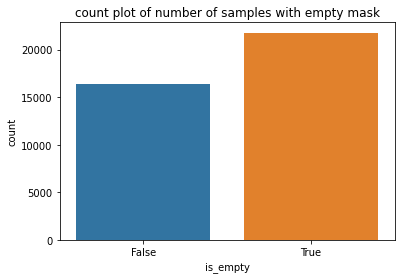

In [17]:
sns.countplot(x ='is_empty', data = data_df)
plt.title('count plot of number of samples with empty mask')

In [18]:
def get_images(paths):
    images = []
    for img_path in tqdm.tqdm(paths):
        sample_img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        images.append(sample_img)
        
    return images
        
loaded_images = get_images(data_df.path)

100%|██████████| 38208/38208 [01:08<00:00, 554.55it/s]


In [19]:
len(loaded_images)

38208

In [20]:
class Noise:
    
    @staticmethod
    def apply_gaussian(image, mean=0, std=1):
        noise = torch.normal(mean=mean, std=std, size=image.shape)
        image = image + noise
        return image

    @staticmethod
    def apply_speckle(image, mean=0, std=1):
        speckle = image * Noise.apply_gaussian(image, mean, std)
        image = image + speckle
        return image


    @staticmethod
    def apply_salt_and_pepper(image, n_pixels=500):
        _, H, W = image.shape

        for op in ['salt', 'pepper']:
            val = image.max()
            if op == 'pepper':val = 0
            
            for i in range(n_pixels):
                x_coord = random.randint(0, W-1)
                y_coord = random.randint(0, H-1)
                image[:, y_coord, x_coord] = val
        return image
        
    @staticmethod
    def apply_poisson(image, rate=5):
        noise = torch.rand(*image.shape) * rate
        noise = torch.poisson(noise)
        image = image + noise
        return image


class FirstChannelRandomGaussianBlur(object):
    def __init__(self, p, kernel_size=(3, 9), sigma=(0.1, 11)):
        self.p = p
        self.kernel_size = kernel_size
        self.sigma = sigma
        self.gaussian_blur = transforms.GaussianBlur(kernel_size=self.kernel_size, sigma=self.sigma)

    def __call__(self, sample):
        #input shape: (4, H, W)
        if self.p < random.random():return sample

        image, mask = sample[0].unsqueeze(dim=0), sample[1:]
        image = self.gaussian_blur(image)
        sample = torch.cat((image, mask), dim=0)
        return sample


class FirstChannelRandomNoise(object):
    def __init__(self, p=0.5, **kwargs):
        defaultKwargs = {
            'mean_range':(0, 50),
            'std_range':(1, 50),
            'sp_px_range':(300, 5000),
            'poisson_rate_range':(5, 100)}
        
        self.p = p
        self.kwargs = {**defaultKwargs, **kwargs}
        self.ops = ('gaussian', 'speckle', 'salt_&_pepper', 'poisson')

    def __call__(self, sample):
        if self.p < random.random():return sample

        image, mask = sample[0].unsqueeze(dim=0), sample[1:]
        op = random.choice(self.ops)
        if op == 'gaussian':
            mean = random.randint(*self.kwargs['mean_range'])
            std = random.randint(*self.kwargs['std_range'])
            image = Noise.apply_gaussian(image, mean, std)

        elif op == 'speckle':
            mean = random.randint(*self.kwargs['mean_range'])
            std = random.randint(*self.kwargs['std_range'])
            image = Noise.apply_speckle(image, mean, std)

        elif op == 'salt_&_pepper':
            n_pixels = random.randint(*self.kwargs['sp_px_range'])
            image = Noise.apply_salt_and_pepper(image, n_pixels)

        elif op == 'poisson':
            rate = random.randint(*self.kwargs['poisson_rate_range'])
            image = Noise.apply_poisson(image, rate)

        sample = torch.cat((image, mask), dim=0)
        return sample

        
class CustomRandomRotation(object):
    def __init__(self, p, angle_range=(0, 360)):
        self.p = p
        self.angle_range = angle_range
        self.random_rotation = transforms.RandomRotation(self.angle_range)

    def __call__(self, sample):
        #input shape: (C, H, W)
        if self.p < random.random():return sample

        sample = self.random_rotation(sample)
        return sample

  
class CustomRandomResizedCrop(object):
    def __init__(self, p, scale=(0.5, 1.0)):
        self.p = p
        self.scale = scale

    def __call__(self, sample):
        #input shape: (C, H, W)
        if self.p < random.random():return sample

        _, H, W = sample.shape
        random_resizedcrop = transforms.RandomResizedCrop(
            (H, W), scale=self.scale, interpolation=transforms.InterpolationMode.NEAREST)
        sample = random_resizedcrop(sample)
        return sample


def image_resize(image, size=(224, 224)):
    #image shape: C, H, W or N, C, H, W
    H, W = size
    assert len(image.shape) == 3 or len(image.shape) == 4, \
     'input image must be of shape  C, H, W or N, C, H, W'

    if isinstance(image, np.ndarray): image = torch.from_numpy(image) 
    res_model = transforms.Resize((H, W), interpolation=transforms.InterpolationMode.NEAREST)
    image = res_model(image)
    return image


def image_normalize(image):
    #image size: (C, H, W)
    image = image.max() - image
    image = image - image.min()
    image = image / image.max()
    return image    


def data_augmentation(**kwargs):

    defaultKwargs = {
        'shuffle_tranforms':True,
        'crop_p':0.5, 
        'rotation_p':0.5, 
        'Hflip_p':0.5, 
        'Vflip_p':0.5, 
        'blur_p':0.5,
        'noise_p':0.5,
        'rotation_angle_range':(-60, 60),
        'crop_scale':(0.5, 1.0),
        'blur_kernel_size':(3, 9),
        'blur_sigma':(0.1, 11),
        }

    kwargs = {**defaultKwargs, **kwargs}

    transform_list = [
        CustomRandomResizedCrop(p=kwargs['crop_p'], scale=kwargs['crop_scale']),
        CustomRandomRotation(p=kwargs['rotation_p'], angle_range=kwargs['rotation_angle_range']),
        transforms.RandomHorizontalFlip(kwargs['Hflip_p']),
        transforms.RandomVerticalFlip(kwargs['Vflip_p']),
        FirstChannelRandomGaussianBlur(kwargs['blur_p'], kernel_size=kwargs['blur_kernel_size'], sigma=kwargs['blur_sigma']),
        FirstChannelRandomNoise(p=kwargs['noise_p'])
    ]
    if kwargs['shuffle_tranforms']: random.shuffle(transform_list)
    T = transforms.Compose(transform_list)
    return T


data_transforms = data_augmentation()

In [21]:
class ImageDataset(Dataset):
    def __init__(self, images, images_df, transform=None, tp=0.5):
        self.images = images
        self.images_df = images_df
        self.transform = transform
        self.tp = tp
        
        
    def __len__(self):
        return len(self.images_df)
    
       
    def __getitem__(self, idx:int):
        image = self.images[idx]
        image = np.expand_dims(image, axis=0).astype('int32')

        original_H, original_W = image.shape[1:]
        
        lb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.large_bowel[idx])
        sb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.small_bowel[idx])
        stomach_seg_mask = self.rle2mask(image.shape[1:], self.images_df.stomach[idx])
        
        gt_mask = np.stack((lb_seg_mask, sb_seg_mask, stomach_seg_mask), axis=0).astype('int32')

        if self.transform:
            randn = random.random()
            if randn < self.tp:
                aug = self.transform(
                    torch.from_numpy(
                        np.concatenate((image, gt_mask), axis=0)
                    ))
                image, gt_mask = aug[0].unsqueeze(dim=0), aug[1:]

        image = image_resize(image).type(torch.float32) #shape: (1, H, W)
        gt_mask = image_resize(gt_mask).type(torch.float32) #shape: (3, H, W)
        image = image_normalize(image)

        return image, gt_mask
    

    def rle2mask(self, img_shape, rle:str):
        #correct order: (H, W)
        H, W = img_shape
        if pd.isnull(rle): return np.zeros((H, W), dtype=np.int8)
        
        rle = rle.split()
        start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
        end_idx = start_idx + (lengths - 1)

        mask = np.zeros(H*W, dtype=np.int8)
        for start, end in zip(start_idx, end_idx):
            mask[start:end] = 1

        mask = mask.reshape(H, W)
        return mask

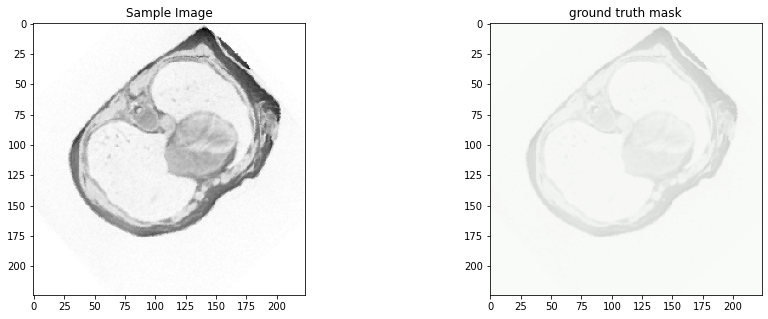

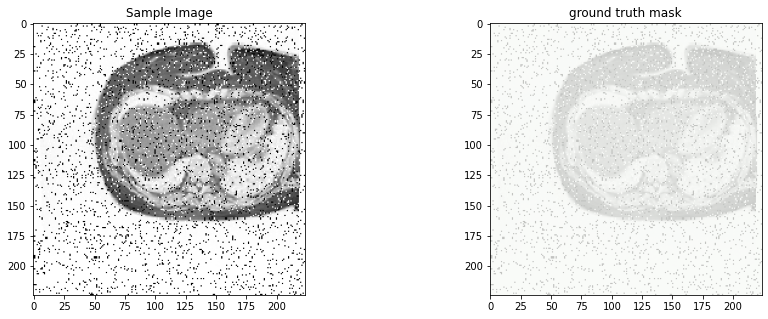

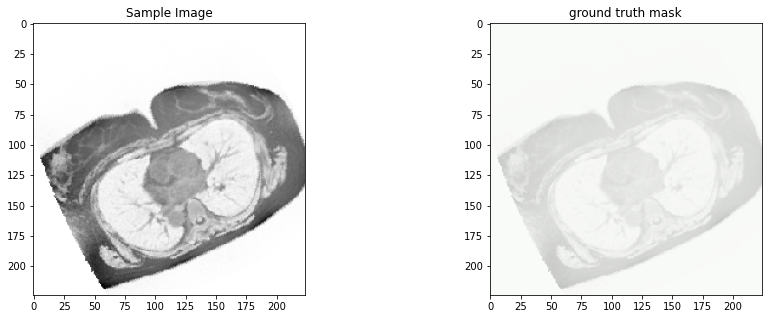

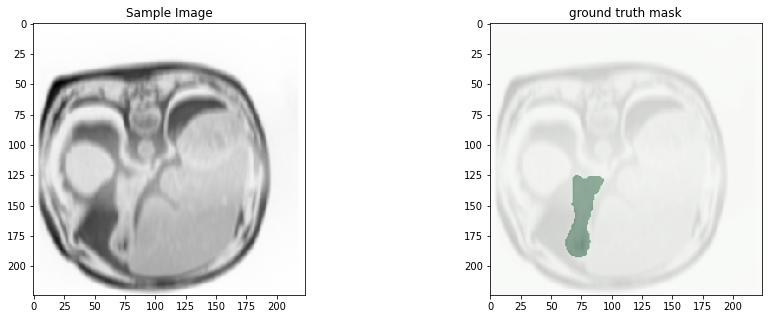

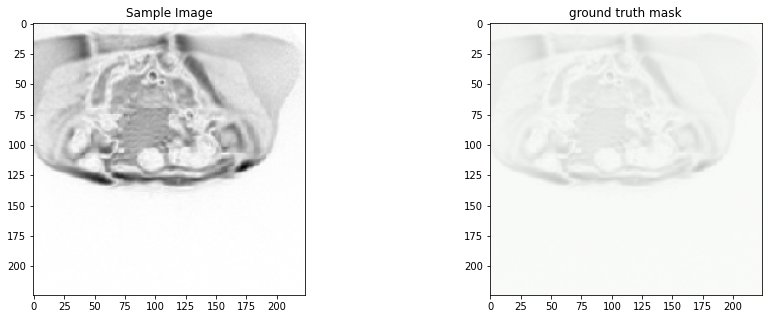

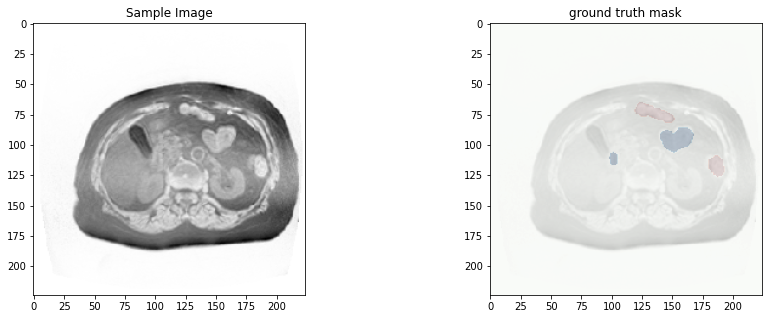

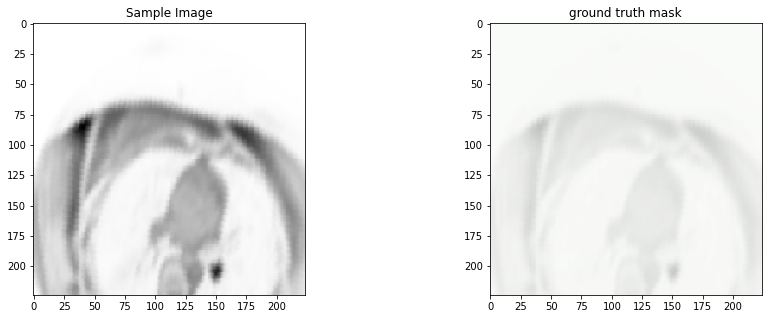

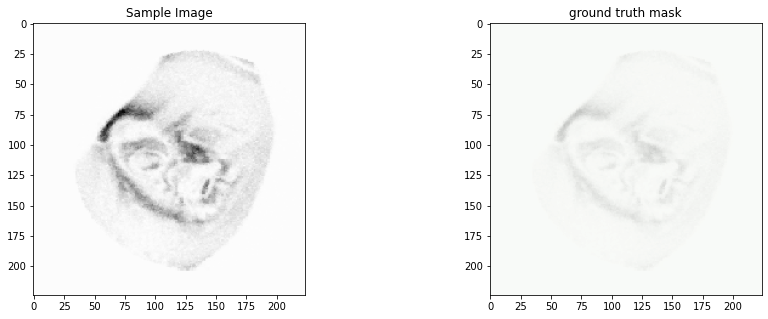

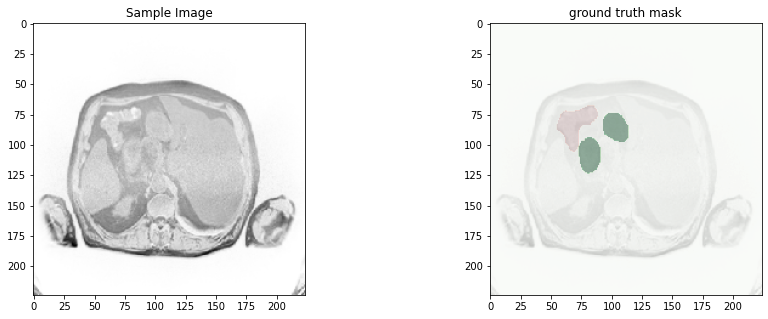

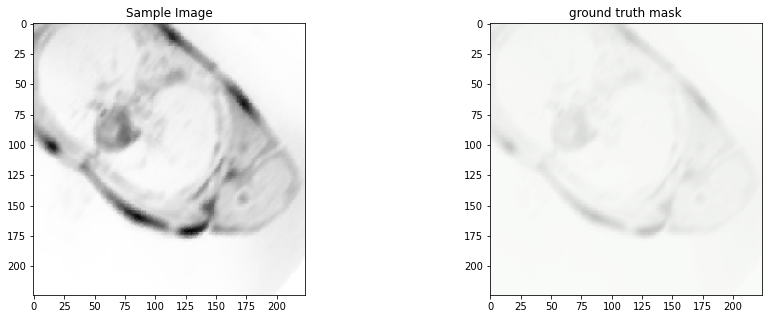

In [22]:
data = ImageDataset(loaded_images, data_df, transform=data_transforms, tp=0.8)

for i in range(10):
    i = random.randint(0, len(data)-1)
    image, gt_mask = data[i]

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    alpha = 0.4

    image = image_resize(image, size=(gt_mask.shape[1:]))

    axs[0].imshow(image.squeeze(), cmap='gray')
    axs[0].set_title('Sample Image')

    axs[1].imshow(image.squeeze(), cmap='gray')
    axs[1].imshow(gt_mask[0], cmap='Reds', alpha=alpha)
    axs[1].imshow(gt_mask[1], cmap='Blues', alpha=alpha)
    axs[1].imshow(gt_mask[2], cmap='Greens', alpha=alpha)
    axs[1].set_title('ground truth mask')

In [23]:
torch.manual_seed(3407)
torch.cuda.manual_seed(3407)
np.random.seed(3407)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [24]:
class SpatialEncoder(ResNet):
    def __init__(self, input_channels, dropout=0.2, 
                 pretrained=False, block=BasicBlock, block_layers=[3, 4, 6, 3]):
      
        self.block = block
        self.block_layers = block_layers
        
        super(SpatialEncoder, self).__init__(self.block, self.block_layers)
        
        self.input_channels = input_channels
        self.dropout = dropout
        self.pretrained = pretrained
        
        self.conv1 = nn.Conv2d(
            self.input_channels, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3), 
            bias=False)
        
        self.conv2 = nn.Conv2d(
            64, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3),
            bias=False)
        
        self.dropout_layer = nn.Dropout(self.dropout)

        #delete unwanted layers
        del self.maxpool, self.fc, self.avgpool
        
        
    def forward(self, x):
        fmap1 = self.conv1(x)
        x = self.conv2(fmap1)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout_layer(x)
        fmap2 = self.layer1(x)
        fmap3 = self.layer2(fmap2)
        fmap4 = self.layer3(fmap3)
        fmap5 = self.layer4(fmap4)
        
        return fmap1, fmap2, fmap3, fmap4, fmap5

In [25]:
class Decoder(nn.Module):
    def __init__(self, last_fmap_channel, output_channel, n_classes, dropout=0.2):
        super(Decoder, self).__init__()
        
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.n_classes = n_classes
        self.dropout = dropout
        
        fmap1_ch, fmap2_ch, fmap3_ch, fmap4_ch, fmap5_ch = (
            self.last_fmap_channel//8,
            self.last_fmap_channel//8, 
            self.last_fmap_channel//4, 
            self.last_fmap_channel//2, 
            self.last_fmap_channel
            )
        
        if self.last_fmap_channel == 2048:
            fmap1_ch = self.last_fmap_channel//32

        
        self.layer1 = nn.Sequential(
            nn.ConvTranspose2d(fmap5_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap4_ch
        self.layer2 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap3_ch
        self.layer3 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap2_ch
        self.layer4 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap1_ch
        self.layer5 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, self.output_channel*self.n_classes, (2, 2), stride=(2, 2)),
            nn.Sigmoid()
        )
        
    def forward(self, fmap1, fmap2, fmap3, fmap4, fmap5):
        output = self.layer1(fmap5)
        output = torch.cat((output, fmap4), dim=1)
        
        output = self.layer2(output)
        output = torch.cat((output, fmap3), dim=1)
        
        output = self.layer3(output)
        output = torch.cat((output, fmap2), dim=1)
        
        output = self.layer4(output)
        output = torch.cat((output, fmap1), dim=1)
        output = self.layer5(output)
        
        return output

In [26]:
class SegmentNet(nn.Module):
    def __init__(self, input_channels, last_fmap_channel, 
                output_channel, n_classes, 
                pretrained=False, enc_dropout=0.1,
                dec_dropout=0.1):
        
        super(SegmentNet, self).__init__()
    
        self.input_channels = input_channels
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.pretrained = pretrained
        self.n_classes = n_classes
        self.enc_dropout = enc_dropout
        self.dec_dropout = dec_dropout
        
        self.encoder = SpatialEncoder(
            self.input_channels, 
            self.enc_dropout)
        
        self.decoder = Decoder(
            self.last_fmap_channel, 
            self.output_channel, 
            self.n_classes, 
            self.dec_dropout
        )
        
    
    def forward(self, x, output_size=None):
        fmap1, fmap2, fmap3, fmap4, fmap5 = self.encoder(x)
        segmentation_mask = self.decoder(fmap1, fmap2, fmap3, fmap4, fmap5)

        if output_size:
            segmentation_mask = image_resize(segmentation_mask, size=output_size)
        
        return segmentation_mask
    

In [27]:
class FitterPipeline:
    def __init__(self, model, lossfunc, optimizer, device='cpu', 
                 weight_init=True, custom_weight_initializer=None):
      
        self.device = device
        self.model = model.to(self.device)
        self.lossfunc = lossfunc
        self.optimizer = optimizer
        self.weight_init = weight_init
        self.custom_weight_initializer = custom_weight_initializer
        
        if self.weight_init:
            if self.custom_weight_initializer:
                self.model.apply(self.custom_weight_initializer)
            else:
                self.model.apply(self.xavier_init_weights)
        
    
    def xavier_init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight)
            if torch.is_tensor(m.bias):
                m.bias.data.fill_(0.01)
    
    
    def save_model(self, dirname='./model_params', 
                   filename='tumor_segmentation_params.pth.tar'):
        if not os.path.isdir(dirname):os.mkdir(dirname)
        state_dicts = {
            'segmentation_net_params':self.model.state_dict(),
            'optimizer_params':self.optimizer.state_dict(),
        }
        return torch.save(state_dicts, os.path.join(dirname, filename))
        

    def train(self, dataloader, epochs=1, verbose=False):
        self.model.train()
        
        losses, hds, dice_coeffs = [], [], []
        for epoch in range(epochs):
            loss, hd, dice_coeff = 0, 0, 0
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):

                self.model.zero_grad()
                image, gt_mask = image.to(self.device), gt_mask.to(self.device)
                
                pred_mask = self.model(image)
                
                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)

                #backward propagation
                batch_loss.backward()
                self.optimizer.step()
                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
            loss = loss / (idx + 1)
            hd = hd / (idx + 1)
            dice_coeff = dice_coeff / (idx + 1)
            
            if verbose:
                print(f'epoch: {epoch} \nTraining Loss: {loss} \nTrain Dice Coeff: {dice_coeff} \nTrain Hausdorff Distance: {hd}')
            losses.append(loss)
            hds.append(hd)
            dice_coeffs.append(dice_coeff)
        return losses, hds, dice_coeffs
    
    
    def test(self, dataloader, verbose=False):
        self.model.eval()
        
        loss, hd, dice_coeff = 0, 0, 0
        with torch.no_grad():
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):

                image, gt_mask = image.to(self.device), gt_mask.to(self.device)

                pred_mask = self.model(image)

                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)
                                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
        loss = loss / (idx + 1)
        hd = hd / (idx + 1)
        dice_coeff = dice_coeff / (idx + 1)

        if verbose:
            print(f'\n Testing Loss: {loss}  \nTest Dice Coeff: {dice_coeff} \nTest Hausdorff Distance: {hd}')
        return loss, hd, dice_coeff

In [28]:
def trim_empty_tag(df, p):
    rand_n = np.random.rand()
    df['to_delete'] = False
    if df.is_empty == True:
        if rand_n < p:
            df['to_delete'] = True
    return df

def trim_empty(df, images, p=0.3):
    assert p <= 1, 'p should be within range of 0 and 1'
    trim = lambda df: trim_empty_tag(df, p)
    df = df.apply(trim, axis=1)

    trim_mask = df['to_delete'].values
    images = [i for (i, m) in zip(images, trim_mask) if m != True]
    df = df[df['to_delete'] != True]
    df.index = [i for i in range(len(df))]
    return df, images

In [29]:
train_size = 0.9
test_size = 0.05
eval_size = 0.05

train_length = int(len(loaded_images) * train_size)
test_length = int(len(loaded_images) * test_size)
eval_length = int(len(loaded_images) * eval_size)

train_images, test_images, eval_images = (
    loaded_images[:train_length],
    loaded_images[train_length:train_length+test_length],
    loaded_images[train_length+test_length:])

train_data_df, test_data_df, eval_data_df = (
    data_df.iloc[:train_length, :], 
    data_df.iloc[train_length:train_length+test_length, :],
    data_df.iloc[train_length+test_length:, :])

test_data_df.index = [i for i in range(len(test_data_df))]
eval_data_df.index = [i for i in range(len(eval_data_df))]

#reduce the number of empty samples for training and testing data

train_data_df, train_images = trim_empty(train_data_df, train_images, p=0.85)
test_data_df, test_images = trim_empty(test_data_df, test_images, p=0.85)
eval_data_df, eval_images = trim_empty(eval_data_df, eval_images)


batch_size = 40

train_data = ImageDataset(train_images, train_data_df, transform=data_transforms, tp=0.85)
train_dataloader = DataLoader(train_data, shuffle=True, batch_size=batch_size, num_workers=4)

test_data = ImageDataset(test_images, test_data_df, transform=data_transforms, tp=0.50)
test_dataloader = DataLoader(test_data, shuffle=True, batch_size=batch_size, num_workers=4)

eval_data = ImageDataset(eval_images, eval_data_df, transform=None)
eval_dataloader = DataLoader(eval_data, shuffle=True, batch_size=batch_size, num_workers=4)

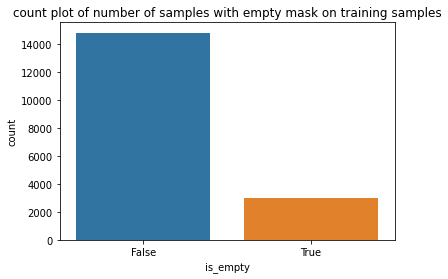

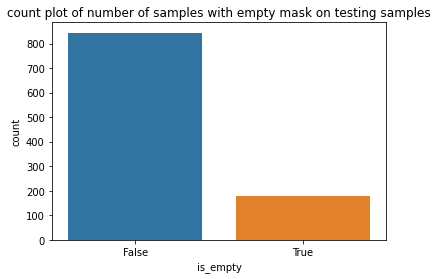

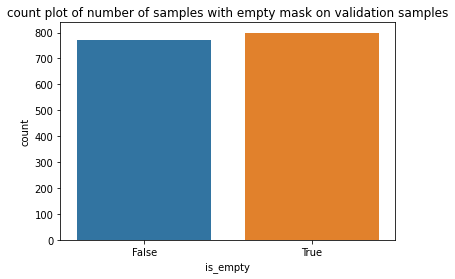

In [30]:
sns.countplot(x ='is_empty', data = train_data_df)
plt.title('count plot of number of samples with empty mask on training samples')
plt.show()

sns.countplot(x ='is_empty', data = test_data_df)
plt.title('count plot of number of samples with empty mask on testing samples')
plt.show()

sns.countplot(x ='is_empty', data = eval_data_df)
plt.title('count plot of number of samples with empty mask on validation samples')
plt.show()

In [31]:
del data_df, loaded_images
gc.collect()

6650

In [32]:
class SegementationMetric(nn.Module):
    def __init__(self, w1=0.6, w2=0.4):
        """
        w1 corresponds to weightage of hausdorff distance
        w2 corresponds to weightage of dice coefficent score
        """

        assert w1 + w2 == 1, 'sum of all weights must be equal to 1'
        super(SegementationMetric, self).__init__()

        self.w1 = w1
        self.w2 = w2
        self.bce_loss = nn.BCELoss()

    
    def hausdorff_distance(self, pred, target):
        #pred shape: (N, C, H, W)
        #target shape: (N, C, H, W)
        pred = pred.detach().cpu().round()
        target = target.cpu()

        max_dist = max(target.shape[2:])

        warnings.filterwarnings("ignore")

        #compute the hausdorff distance for each batch
        batch_distances = compute_hausdorff_distance(pred, target, distance_metric='euclidean', include_background=True)

        batch_distances[batch_distances == torch.inf] = max_dist
        batch_distances[batch_distances != batch_distances] = 0

        #get max distance for each batch and compute mean
        batch_distances = batch_distances.max(dim=1)
        dist = batch_distances[0].mean()
        dist = dist / max_dist
        return dist


    def dice_coeff(self, prediction, ground_truth, epsilon=1e-5):
        #input shape: N, C, H, W
        prediction = prediction.cpu().round()
        ground_truth = ground_truth.cpu()
        intersection = torch.sum(torch.abs(ground_truth * prediction), dim=(2, 3))
        denominator = ground_truth.sum(dim=(2, 3)) + prediction.sum(dim=(2, 3))
        dice_coeff = ((2 * intersection + epsilon) / (denominator + epsilon)).mean(dim=(0, 1))
        return dice_coeff.item()

      
    def metric_values(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance = self.hausdorff_distance(prediction, ground_truth)
        dice_coeff = self.dice_coeff(prediction, ground_truth)
        bce_loss = self.bce_loss(prediction, ground_truth)

        return hausdorff_distance, dice_coeff, bce_loss

    
    def forward(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance, dice_coeff, bce_loss = self.metric_values(prediction, ground_truth)
        hausdorff_distance = torch.tensor(hausdorff_distance)

        acc_score = (self.w1 * (1 - hausdorff_distance)) + (self.w2 * dice_coeff)
        loss = (1 + bce_loss) * (1 - acc_score).requires_grad_(True)
        return loss
    

In [33]:
input_channels = 1 
last_fmap_channel = 512 #2048
output_channel = 1 
n_classes=3
enc_dropout=0.0
dec_dropout=0.0


model = SegmentNet(
    input_channels, 
    last_fmap_channel, 
    output_channel, 
    n_classes, 
    enc_dropout=enc_dropout,
    dec_dropout=dec_dropout)


learning_rate = 1e-3
weight_decay = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

lossfunc = SegementationMetric(w1=0.6, w2=0.4)

In [34]:
model

SegmentNet(
  (encoder): SpatialEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64,

In [35]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipeline = FitterPipeline(model, lossfunc, optimizer, device)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    pipeline.optimizer, step_size=25, gamma=0.1, verbose=True)

Adjusting learning rate of group 0 to 1.0000e-03.


In [36]:
print(f'Model is training on {torch.cuda.get_device_name()} \n\n')

EPOCHS = 60

training_losses, training_hds, training_dice_coeffs = [], [], []
testing_losses, testing_hds, testing_dice_coeffs = [], [], []

w1, w2 = 0.6, 0.4

best_loss = np.inf
for i in range(EPOCHS):
    print(f'\n\nepoch: {i}')
    train_loss, training_hd, train_dice_coeff = pipeline.train(train_dataloader)
    training_losses.append(train_loss[0])
    training_hds.append(training_hd[0])
    training_dice_coeffs.append(train_dice_coeff[0])
    print(
        f'\ntraining loss: {train_loss[0]}',
        f'\ntraining hausdorff dist: {training_hd[0]}',
        f'\ntraining dice coeff: {train_dice_coeff[0]}', 
        f'\ntrain score: {(w1 * (1 - training_hd[0])) + (w2 * train_dice_coeff[0])}')
    
    test_loss, testing_hd, test_dice_coeff = pipeline.test(test_dataloader)
    testing_losses.append(test_loss)
    testing_hds.append(testing_hd)
    testing_dice_coeffs.append(test_dice_coeff)
    print(f'testing loss: {test_loss}', 
          f'\ntesting hausdorff dist: {testing_hd}', 
          f'\ntesting dice coeff: {test_dice_coeff}',
          f'\ntest score: {(w1 * (1 - testing_hd)) + (w2 * test_dice_coeff)}')
    
    lr_scheduler.step()
    if test_loss < best_loss:
        best_loss = test_loss
        pipeline.save_model()
        print(f'model saved at epoch {i}')

Model is training on Tesla P100-PCIE-16GB 




epoch: 0


445it [09:58,  1.34s/it]


training loss: 0.7807585616891561 
training hausdorff dist: 0.829408638939723 
training dice coeff: 0.4095884150057208 
train score: 0.2661901826384545



26it [00:20,  1.30it/s]


testing loss: 0.6862835149491566 
testing hausdorff dist: 0.7235384596361242 
testing dice coeff: 0.4400333876793201 
test score: 0.34189027929005356
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 0


epoch: 1


445it [10:03,  1.36s/it]


training loss: 0.6201310548228621 
training hausdorff dist: 0.6381673793854257 
training dice coeff: 0.4635776193624132 
train score: 0.4025306201137099



26it [00:20,  1.25it/s]


testing loss: 0.6349838459765759 
testing hausdorff dist: 0.6515078439102445 
testing dice coeff: 0.44562431367544025 
test score: 0.3873450191240294
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 1


epoch: 2


445it [10:11,  1.37s/it]


training loss: 0.5231370982336471 
training hausdorff dist: 0.5230094571078973 
training dice coeff: 0.5175897518570504 
train score: 0.4932302264780818



26it [00:21,  1.22it/s]


testing loss: 0.4861863245613544 
testing hausdorff dist: 0.48648261588963165 
testing dice coeff: 0.5458929080229539 
test score: 0.5264675936754026
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 2


epoch: 3


445it [10:15,  1.38s/it]


training loss: 0.46799787654132796 
training hausdorff dist: 0.4683956415914028 
training dice coeff: 0.5649292621049988 
train score: 0.5449343198871579



26it [00:22,  1.18it/s]

testing loss: 0.5858104615658909 
testing hausdorff dist: 0.5962122400607162 
testing dice coeff: 0.47639694466040683 
test score: 0.43283143382773304
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 4



445it [10:15,  1.38s/it]


training loss: 0.42451369683575957 
training hausdorff dist: 0.4251569529594503 
training dice coeff: 0.6029419327050113 
train score: 0.5860826013063343



26it [00:21,  1.23it/s]


testing loss: 0.43733970719938947 
testing hausdorff dist: 0.4489813391618757 
testing dice coeff: 0.6069681300566747 
test score: 0.5733984485255444
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 4


epoch: 5


445it [10:13,  1.38s/it]


training loss: 0.40039834665298485 
training hausdorff dist: 0.4051299993283841 
training dice coeff: 0.6301155647535003 
train score: 0.6089682263043696



26it [00:21,  1.23it/s]


testing loss: 0.3902773763244066 
testing hausdorff dist: 0.407561595819062 
testing dice coeff: 0.655161800292822 
test score: 0.6175277626256916
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 5


epoch: 6


445it [10:12,  1.38s/it]


training loss: 0.37833480910999606 
training hausdorff dist: 0.38540653568018857 
training dice coeff: 0.653000719024894 
train score: 0.6299563662018445



26it [00:21,  1.21it/s]


testing loss: 0.34283160449010197 
testing hausdorff dist: 0.35261701757459646 
testing dice coeff: 0.6883229613304138 
test score: 0.6637589739874077
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 6


epoch: 7


445it [10:18,  1.39s/it]


training loss: 0.35470299433564245 
training hausdorff dist: 0.36102435626854923 
training dice coeff: 0.6731164671062084 
train score: 0.6526319730813539



26it [00:22,  1.16it/s]

testing loss: 0.3447044338379334 
testing hausdorff dist: 0.3505592508262015 
testing dice coeff: 0.6805960467228522 
test score: 0.66190286819342
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 8



445it [10:25,  1.41s/it]


training loss: 0.3458111416152847 
training hausdorff dist: 0.3547580625278314 
training dice coeff: 0.6848555235380537 
train score: 0.6610873718985226



26it [00:21,  1.21it/s]


testing loss: 0.30593995252679207 
testing hausdorff dist: 0.3080250318816367 
testing dice coeff: 0.7102248874994425 
test score: 0.699274935870795
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 8


epoch: 9


445it [10:26,  1.41s/it]


training loss: 0.32696429063066285 
training hausdorff dist: 0.3359505647246815 
training dice coeff: 0.7021180103334148 
train score: 0.679276865298557



26it [00:21,  1.18it/s]


testing loss: 0.28753081818308834 
testing hausdorff dist: 0.29238348973499356 
testing dice coeff: 0.7315548337422885 
test score: 0.7171918396559193
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 9


epoch: 10


445it [10:20,  1.39s/it]


training loss: 0.31303356560727635 
training hausdorff dist: 0.3226916953569261 
training dice coeff: 0.715678627169534 
train score: 0.692656433653658



26it [00:21,  1.19it/s]

testing loss: 0.2961158146854748 
testing hausdorff dist: 0.30942258954656293 
testing dice coeff: 0.7365862635465769 
test score: 0.7089809516906929
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 11



445it [10:22,  1.40s/it]


training loss: 0.30986599882103494 
training hausdorff dist: 0.31968584502952335 
training dice coeff: 0.7187836325570439 
train score: 0.6957019460051035



26it [00:22,  1.17it/s]

testing loss: 0.3828248017047906 
testing hausdorff dist: 0.4099637271398774 
testing dice coeff: 0.6785605870760404 
test score: 0.6254459985464897
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 12



445it [10:23,  1.40s/it]


training loss: 0.29799619541640415 
training hausdorff dist: 0.30797908890583203 
training dice coeff: 0.7299094849757934 
train score: 0.7071763406468181



26it [00:21,  1.21it/s]


testing loss: 0.28422614525561185 
testing hausdorff dist: 0.2947209792974274 
testing dice coeff: 0.7422908086043137 
test score: 0.720083735863269
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 12


epoch: 13


445it [10:23,  1.40s/it]


training loss: 0.2827931346259676 
training hausdorff dist: 0.29162092025502967 
training dice coeff: 0.7422310404563218 
train score: 0.7219198640295109



26it [00:21,  1.21it/s]


testing loss: 0.2701862901229019 
testing hausdorff dist: 0.2742280530961262 
testing dice coeff: 0.7460940250983605 
test score: 0.7339007781816684
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 13


epoch: 14


445it [10:23,  1.40s/it]


training loss: 0.2827842293743735 
training hausdorff dist: 0.29328046965092824 
training dice coeff: 0.7445633641789469 
train score: 0.7218570638810218



26it [00:21,  1.19it/s]


testing loss: 0.25536747217676753 
testing hausdorff dist: 0.26287777408754076 
testing dice coeff: 0.7650598425131577 
test score: 0.7482972725527386
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 14


epoch: 15


445it [10:23,  1.40s/it]


training loss: 0.27637644557172325 
training hausdorff dist: 0.28624786277887704 
training dice coeff: 0.7496725470832225 
train score: 0.7281203011659628



26it [00:21,  1.20it/s]

testing loss: 0.2982683280976046 
testing hausdorff dist: 0.31214066891200676 
testing dice coeff: 0.7335971479232495 
test score: 0.7061544578220957
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 16



445it [10:23,  1.40s/it]


training loss: 0.26178911928801224 
training hausdorff dist: 0.27087571884506684 
training dice coeff: 0.7620450373446004 
train score: 0.7422925836308001



26it [00:21,  1.19it/s]

testing loss: 0.26270725313499205 
testing hausdorff dist: 0.2749540397555202 
testing dice coeff: 0.7645960702345922 
test score: 0.7408660042405248
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 17



445it [10:23,  1.40s/it]


training loss: 0.26275471271784645 
training hausdorff dist: 0.27327276656085403 
training dice coeff: 0.7632180181781897 
train score: 0.7413235473347635



26it [00:23,  1.09it/s]

testing loss: 0.7213562867715133 
testing hausdorff dist: 0.7681601707466469 
testing dice coeff: 0.4318357270497542 
test score: 0.31183818837191357
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 18



445it [10:23,  1.40s/it]


training loss: 0.25386894357345985 
training hausdorff dist: 0.26320103080474394 
training dice coeff: 0.7696836901514718 
train score: 0.7499528575777423



26it [00:21,  1.21it/s]

testing loss: 0.35040572799727 
testing hausdorff dist: 0.37430278566034186 
testing dice coeff: 0.7040883577786959 
test score: 0.6570536717152733
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 19



445it [10:23,  1.40s/it]


training loss: 0.2482236219139134 
training hausdorff dist: 0.2573582181696295 
training dice coeff: 0.7746240910519375 
train score: 0.7554347055189974



26it [00:21,  1.19it/s]

testing loss: 0.27682524320015084 
testing hausdorff dist: 0.29045657422904664 
testing dice coeff: 0.7547677961679605 
test score: 0.7276331739297562
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 20



445it [10:24,  1.40s/it]


training loss: 0.2445264462694894 
training hausdorff dist: 0.253173400904869 
training dice coeff: 0.7774127287811108 
train score: 0.759061050969523



26it [00:21,  1.20it/s]


testing loss: 0.24425828999302673 
testing hausdorff dist: 0.2577088159930192 
testing dice coeff: 0.7837424507507911 
test score: 0.758871690704505
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 20


epoch: 21


445it [10:23,  1.40s/it]


training loss: 0.24144445979699886 
training hausdorff dist: 0.2508079736111494 
training dice coeff: 0.7812260010269251 
train score: 0.7620056162440803



26it [00:21,  1.19it/s]

testing loss: 0.24666275773749663 
testing hausdorff dist: 0.2537435912508067 
testing dice coeff: 0.7730642992716569 
test score: 0.7569795649581788
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 22



445it [10:23,  1.40s/it]


training loss: 0.23619613985342852 
training hausdorff dist: 0.2446329254514085 
training dice coeff: 0.7848133746157872 
train score: 0.7671455945754697



26it [00:21,  1.18it/s]


testing loss: 0.24080586759222602 
testing hausdorff dist: 0.24644397954810818 
testing dice coeff: 0.7757944189585172 
test score: 0.762451379854542
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 22


epoch: 23


445it [10:23,  1.40s/it]


training loss: 0.23643924502162983 
training hausdorff dist: 0.24581965965302263 
training dice coeff: 0.785916220070271 
train score: 0.7668746922362948



26it [00:21,  1.20it/s]


testing loss: 0.21044220107342657 
testing hausdorff dist: 0.2169486848279885 
testing dice coeff: 0.8055454194545746 
test score: 0.7920489568850368
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 23


epoch: 24


445it [10:22,  1.40s/it]


training loss: 0.22072477210917976 
training hausdorff dist: 0.22795882974731643 
training dice coeff: 0.7975496900215577 
train score: 0.7822445781602333



26it [00:21,  1.20it/s]


testing loss: 0.19026739404938556 
testing hausdorff dist: 0.1907850947620879 
testing dice coeff: 0.8162374886182638 
test score: 0.8120239385900527
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 24


epoch: 25


445it [10:21,  1.40s/it]


training loss: 0.19765104640559322 
training hausdorff dist: 0.2038367077114053 
training dice coeff: 0.8177162605724978 
train score: 0.8047844796021559



26it [00:21,  1.20it/s]


testing loss: 0.17616196613710502 
testing hausdorff dist: 0.1821812891222618 
testing dice coeff: 0.8372737650687878 
test score: 0.825600732554158
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 25


epoch: 26


445it [10:21,  1.40s/it]


training loss: 0.1893587178350116 
training hausdorff dist: 0.19464870870819428 
training dice coeff: 0.8242484155665623 
train score: 0.8129101410017083



26it [00:21,  1.20it/s]


testing loss: 0.16891737135131119 
testing hausdorff dist: 0.17449349114036147 
testing dice coeff: 0.8436471430154947 
test score: 0.8327627625219809
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 26


epoch: 27


445it [10:21,  1.40s/it]


training loss: 0.189687163075468 
training hausdorff dist: 0.19581140231411126 
training dice coeff: 0.825087863407778 
train score: 0.8125483039746444



26it [00:21,  1.18it/s]


testing loss: 0.16095246519988093 
testing hausdorff dist: 0.16194260974576863 
testing dice coeff: 0.844623870574511 
test score: 0.8406839823823433
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 27


epoch: 28


445it [10:21,  1.40s/it]


training loss: 0.18491586300291968 
training hausdorff dist: 0.19002883866553147 
training dice coeff: 0.8281162979897488 
train score: 0.8172292159965806



26it [00:21,  1.19it/s]

testing loss: 0.16227225982225818 
testing hausdorff dist: 0.16505043188205668 
testing dice coeff: 0.845800193456503 
test score: 0.8392898182533672
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 29



445it [10:19,  1.39s/it]


training loss: 0.18334908724266424 
training hausdorff dist: 0.1884163389456861 
training dice coeff: 0.8295483540952875 
train score: 0.8187695382707033



26it [00:21,  1.20it/s]


testing loss: 0.15989182974112143 
testing hausdorff dist: 0.1604344947271481 
testing dice coeff: 0.8447972513162173 
test score: 0.8416582036901981
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 29


epoch: 30


445it [10:20,  1.39s/it]


training loss: 0.18380911691385587 
training hausdorff dist: 0.18906774928375064 
training dice coeff: 0.8293574937273948 
train score: 0.8183023479207074



26it [00:21,  1.21it/s]


testing loss: 0.15565646201444513 
testing hausdorff dist: 0.15611514144372796 
testing dice coeff: 0.8487127400361575 
test score: 0.8458160111482262
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 30


epoch: 31


445it [10:18,  1.39s/it]


training loss: 0.1806428504836788 
training hausdorff dist: 0.185649414124586 
training dice coeff: 0.8320315197612462 
train score: 0.8214229594297469



26it [00:21,  1.21it/s]

testing loss: 0.15590160803754777 
testing hausdorff dist: 0.1584632834300933 
testing dice coeff: 0.8516769592578595 
test score: 0.8455928136450879
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 32



445it [10:20,  1.39s/it]


training loss: 0.17977617942684285 
training hausdorff dist: 0.18465688276982073 
training dice coeff: 0.8326674948917346 
train score: 0.8222728682948014



26it [00:21,  1.19it/s]

testing loss: 0.1730393091950517 
testing hausdorff dist: 0.1807045617353012 
testing dice coeff: 0.8428092415516193 
test score: 0.828700959579467
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 33



445it [10:21,  1.40s/it]


training loss: 0.17971845478552104 
training hausdorff dist: 0.18507749785756336 
training dice coeff: 0.8334044236815378 
train score: 0.8223152707580772



26it [00:21,  1.20it/s]

testing loss: 0.1558926741806626 
testing hausdorff dist: 0.16019893832820975 
testing dice coeff: 0.8543796080809373 
test score: 0.8456324802354491
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 34



445it [10:25,  1.41s/it]


training loss: 0.17653145618900237 
training hausdorff dist: 0.18142936703880394 
training dice coeff: 0.8357820020632798 
train score: 0.8254551806020296



26it [00:21,  1.19it/s]


testing loss: 0.15196464603269128 
testing hausdorff dist: 0.15277714045958035 
testing dice coeff: 0.8530314404230851 
test score: 0.8495462918934858
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 34


epoch: 35


445it [10:24,  1.40s/it]


training loss: 0.17490004944733842 
training hausdorff dist: 0.17895145053642786 
training dice coeff: 0.836068722907077 
train score: 0.8270566188409741



26it [00:22,  1.18it/s]

testing loss: 0.15819522845327522 
testing hausdorff dist: 0.16227262160811284 
testing dice coeff: 0.8518333756006681 
test score: 0.8433697772753994
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 36



445it [10:25,  1.40s/it]


training loss: 0.17536981214260092 
training hausdorff dist: 0.18058244214123412 
training dice coeff: 0.837309674600537 
train score: 0.8265744045554744



26it [00:21,  1.19it/s]


testing loss: 0.15032405884390915 
testing hausdorff dist: 0.1502112321768564 
testing dice coeff: 0.8529479343157548 
test score: 0.8510524344201881
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 36


epoch: 37


445it [10:23,  1.40s/it]


training loss: 0.17293417772585593 
training hausdorff dist: 0.17717845198723214 
training dice coeff: 0.8381963914699768 
train score: 0.8289714853956515



26it [00:22,  1.18it/s]


testing loss: 0.14975216624484766 
testing hausdorff dist: 0.152454239986132 
testing dice coeff: 0.8577357759842505 
test score: 0.8516217664020211
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 37


epoch: 38


445it [10:24,  1.40s/it]


training loss: 0.17244767102375866 
training hausdorff dist: 0.1766473204792364 
training dice coeff: 0.8385780453681946 
train score: 0.8294428258597359



26it [00:21,  1.19it/s]


testing loss: 0.1461753430621172 
testing hausdorff dist: 0.14709127193763724 
testing dice coeff: 0.8584809234509101 
test score: 0.8551376062177816
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 38


epoch: 39


445it [10:23,  1.40s/it]


training loss: 0.17270832350158277 
training hausdorff dist: 0.17760139154540094 
training dice coeff: 0.8393713247909974 
train score: 0.8291876949891583



26it [00:21,  1.20it/s]

testing loss: 0.15172565570589952 
testing hausdorff dist: 0.1545513957903134 
testing dice coeff: 0.855981157376216 
test score: 0.8496616254762983
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 40



445it [10:23,  1.40s/it]


training loss: 0.1725003580044568 
training hausdorff dist: 0.17737253851330978 
training dice coeff: 0.8395421518368668 
train score: 0.8293933376267608



26it [00:22,  1.18it/s]

testing loss: 0.1584811157946104 
testing hausdorff dist: 0.16304633670228125 
testing dice coeff: 0.8521049710420462 
test score: 0.8430141863954497
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 41



445it [10:23,  1.40s/it]


training loss: 0.16974999699700682 
training hausdorff dist: 0.17412220485254049 
training dice coeff: 0.841413109490041 
train score: 0.8320919208844921



26it [00:21,  1.18it/s]

testing loss: 0.15049040599723493 
testing hausdorff dist: 0.1544776367899378 
testing dice coeff: 0.8590219983687768 
test score: 0.850922217273548
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 42



445it [10:23,  1.40s/it]


training loss: 0.17016265292272906 
training hausdorff dist: 0.17471606095269718 
training dice coeff: 0.8412739409489578 
train score: 0.8316799398079648



26it [00:22,  1.18it/s]

testing loss: 0.14921967325104296 
testing hausdorff dist: 0.14941003059631675 
testing dice coeff: 0.8546137947302598 
test score: 0.8521994995343138
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 43



445it [10:23,  1.40s/it]


training loss: 0.16814138293134084 
training hausdorff dist: 0.1723815415233552 
training dice coeff: 0.8427880822942498 
train score: 0.8336863080036868



26it [00:21,  1.20it/s]


testing loss: 0.14539215314145387 
testing hausdorff dist: 0.14710907246736776 
testing dice coeff: 0.8603667593919314 
test score: 0.8558812602763519
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 43


epoch: 44


445it [10:22,  1.40s/it]


training loss: 0.1663510199543307 
training hausdorff dist: 0.17001105511419803 
training dice coeff: 0.8435939573170094 
train score: 0.8354309498582849



26it [00:21,  1.21it/s]

testing loss: 0.15459867589495901 
testing hausdorff dist: 0.15864145653135855 
testing dice coeff: 0.8548974280173962 
test score: 0.8467740972881433
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 45



445it [10:22,  1.40s/it]


training loss: 0.16779722249006523 
training hausdorff dist: 0.17225949023713225 
training dice coeff: 0.8433847026878528 
train score: 0.8339981869328618



26it [00:21,  1.19it/s]

testing loss: 0.15139694205973614 
testing hausdorff dist: 0.15638041910493564 
testing dice coeff: 0.8594847390284905 
test score: 0.8499656441484349
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 46



445it [10:23,  1.40s/it]


training loss: 0.16500804555162746 
training hausdorff dist: 0.16859551724826383 
training dice coeff: 0.8447921061783694 
train score: 0.8367595321223895



26it [00:22,  1.18it/s]

testing loss: 0.14886222620195289 
testing hausdorff dist: 0.15257298360398774 
testing dice coeff: 0.8600638462946966 
test score: 0.852481748355486
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 47



445it [10:23,  1.40s/it]


training loss: 0.16407615225894032 
training hausdorff dist: 0.1679417837018822 
training dice coeff: 0.8460576141818186 
train score: 0.8376579754515981



26it [00:21,  1.20it/s]

testing loss: 0.1481301618428286 
testing hausdorff dist: 0.1492821797524183 
testing dice coeff: 0.8568783975564517 
test score: 0.8531820511711297
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 48



445it [10:23,  1.40s/it]


training loss: 0.1662216926387401 
training hausdorff dist: 0.17048431380276502 
training dice coeff: 0.8445803934268737 
train score: 0.8355415690890905



26it [00:21,  1.19it/s]


testing loss: 0.13811426448201905 
testing hausdorff dist: 0.1374693524559236 
testing dice coeff: 0.8639120963903574 
test score: 0.8630832270825888
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 48


epoch: 49


445it [10:23,  1.40s/it]


training loss: 0.16269951830592805 
training hausdorff dist: 0.1664710232414534 
training dice coeff: 0.8472318993525558 
train score: 0.8390101457961503



26it [00:21,  1.20it/s]

testing loss: 0.14092403519760455 
testing hausdorff dist: 0.14074096994358495 
testing dice coeff: 0.861950335594324 
test score: 0.8603355522715785
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 50



445it [10:23,  1.40s/it]


training loss: 0.1603948503466816 
training hausdorff dist: 0.16394171139086217 
training dice coeff: 0.8491110726688685 
train score: 0.8412794022330301



26it [00:22,  1.18it/s]

testing loss: 0.1425481968607418 
testing hausdorff dist: 0.14507641509397098 
testing dice coeff: 0.8642852994111868 
test score: 0.8586682707080922
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 51



445it [10:22,  1.40s/it]


training loss: 0.1570275209252611 
training hausdorff dist: 0.15984672610764264 
training dice coeff: 0.8512653621394982 
train score: 0.8445981091912137



26it [00:21,  1.20it/s]

testing loss: 0.13976199412316398 
testing hausdorff dist: 0.14020243980571873 
testing dice coeff: 0.8639820263935969 
test score: 0.8614713466740076
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 52



445it [10:23,  1.40s/it]


training loss: 0.16091038294126683 
training hausdorff dist: 0.1648938619311497 
training dice coeff: 0.8492277553911959 
train score: 0.8407547849977884



26it [00:21,  1.19it/s]


testing loss: 0.13789313897042138 
testing hausdorff dist: 0.13951096243183164 
testing dice coeff: 0.8674968779087067 
test score: 0.8632921737043837
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 52


epoch: 53


445it [10:23,  1.40s/it]


training loss: 0.1568301782755134 
training hausdorff dist: 0.16009050665634056 
training dice coeff: 0.8520638956112808 
train score: 0.844771254250708



26it [00:21,  1.19it/s]


testing loss: 0.13407554927692084 
testing hausdorff dist: 0.13361691145621515 
testing dice coeff: 0.8681504726409912 
test score: 0.8670900421826675
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 53


epoch: 54


445it [10:24,  1.40s/it]


training loss: 0.15833004895838473 
training hausdorff dist: 0.16179807255863773 
training dice coeff: 0.8509359769606858 
train score: 0.8432955472490916



26it [00:21,  1.19it/s]

testing loss: 0.13884824530442136 
testing hausdorff dist: 0.13936739198317333 
testing dice coeff: 0.864796886077294 
test score: 0.8622983192410136
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 55



445it [10:23,  1.40s/it]


training loss: 0.15734852798243848 
training hausdorff dist: 0.16061268161996745 
training dice coeff: 0.8515699559383179 
train score: 0.8442603734033467



26it [00:21,  1.19it/s]

testing loss: 0.14426022171310204 
testing hausdorff dist: 0.146253678052608 
testing dice coeff: 0.8620200684437385 
test score: 0.8570558205459305
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 56



445it [10:21,  1.40s/it]


training loss: 0.15746790177874181 
training hausdorff dist: 0.1604207418762722 
training dice coeff: 0.8509815090158013 
train score: 0.8441401584805571



26it [00:21,  1.20it/s]

testing loss: 0.1477780187432422 
testing hausdorff dist: 0.15191990809889624 
testing dice coeff: 0.8617003605915949 
test score: 0.8535281993773003
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 57



445it [10:22,  1.40s/it]


training loss: 0.15900294285417163 
training hausdorff dist: 0.1626132005720177 
training dice coeff: 0.8504579612378323 
train score: 0.8426152641519223



26it [00:21,  1.20it/s]


testing loss: 0.13168772333089257 
testing hausdorff dist: 0.12928799264514834 
testing dice coeff: 0.8674971048648541 
test score: 0.8694260463588527
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 57


epoch: 58


445it [10:23,  1.40s/it]


training loss: 0.1590531132740062 
training hausdorff dist: 0.16279428001107832 
training dice coeff: 0.850636631451296 
train score: 0.8425780845738713



26it [00:21,  1.20it/s]

testing loss: 0.13907868318045208 
testing hausdorff dist: 0.14092677265386003 
testing dice coeff: 0.8667099613409776 
test score: 0.862127920944075
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 59



445it [10:23,  1.40s/it]


training loss: 0.15834019597145826 
training hausdorff dist: 0.16191278246935178 
training dice coeff: 0.8510884009050519 
train score: 0.8432876908804097



26it [00:21,  1.20it/s]

testing loss: 0.14278135474637502 
testing hausdorff dist: 0.14660395406504675 
testing dice coeff: 0.8659279002593114 
test score: 0.8584087876646965
Adjusting learning rate of group 0 to 1.0000e-05.


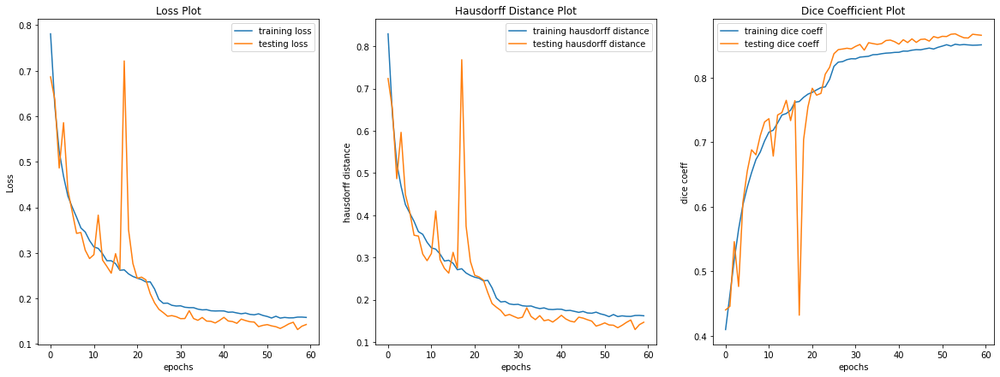

In [37]:
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

axs[0].plot(training_losses, label='training loss')
axs[0].plot(testing_losses, label='testing loss')
axs[0].set_xlabel('epochs')
axs[0].set_ylabel('Loss')
axs[0].set_title('Loss Plot')
axs[0].legend()

axs[1].plot(training_hds, label='training hausdorff distance')
axs[1].plot(testing_hds, label='testing hausdorff distance')
axs[1].set_xlabel('epochs')
axs[1].set_ylabel('hausdorff distance')
axs[1].set_title('Hausdorff Distance Plot')
axs[1].legend()

axs[2].plot(training_dice_coeffs, label='training dice coeff')
axs[2].plot(testing_dice_coeffs, label='testing dice coeff')
axs[2].set_xlabel('epochs')
axs[2].set_ylabel('dice coeff')
axs[2].set_title('Dice Coefficient Plot')
axs[2].legend()

In [38]:
best_model_path = './model_params/tumor_segmentation_params.pth.tar' 
best_model_state = torch.load(best_model_path)['segmentation_net_params']

pipeline.model.load_state_dict(best_model_state)

eval_loss, eval_hd, eval_dice_coeff = pipeline.test(eval_dataloader, verbose=True)

40it [00:28,  1.38it/s]


 Testing Loss: 0.0931052817325311  
Test Dice Coeff: 0.9177964836359024 
Test Hausdorff Distance: 0.0996806264600875


 final mean score is: 0.8425325427256162


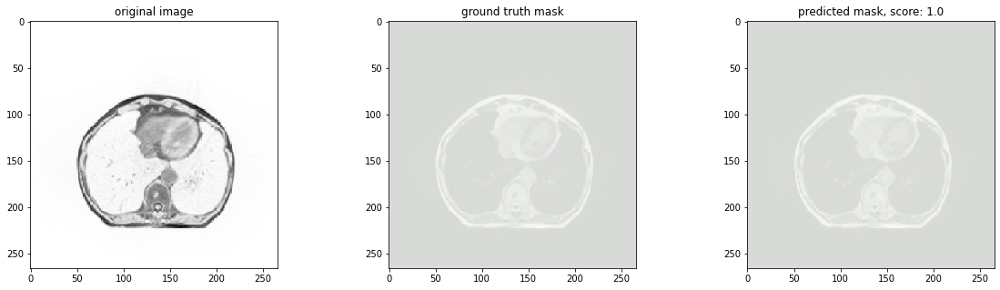

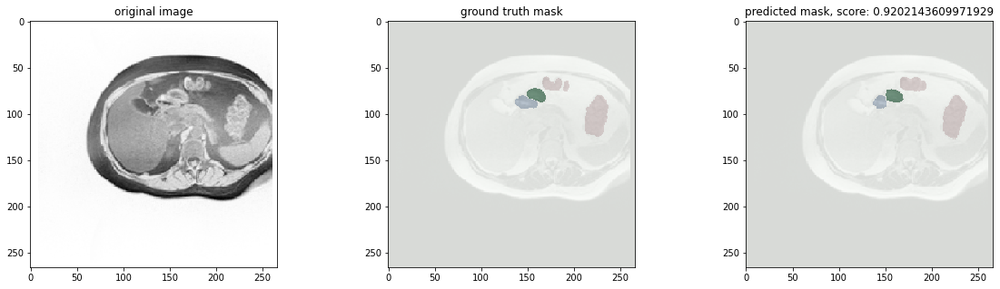

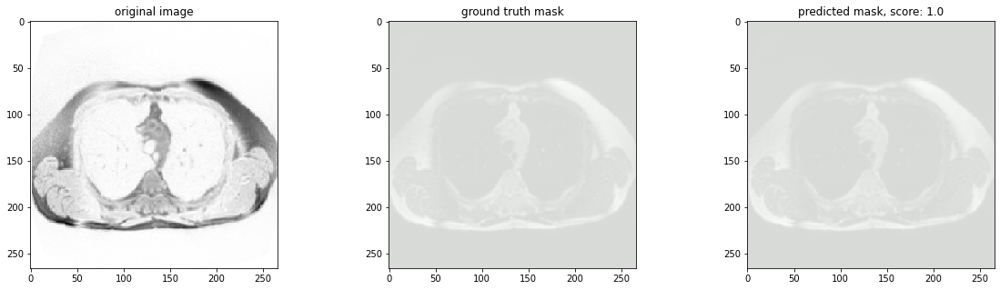

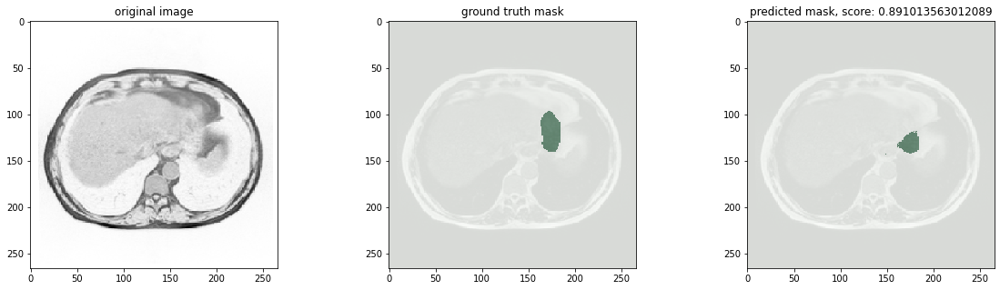

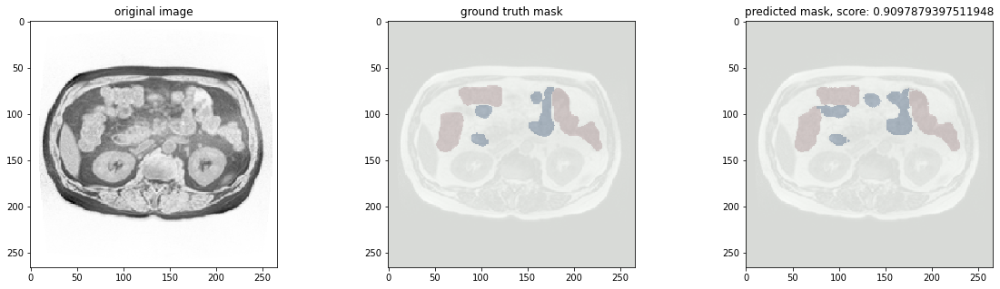

...

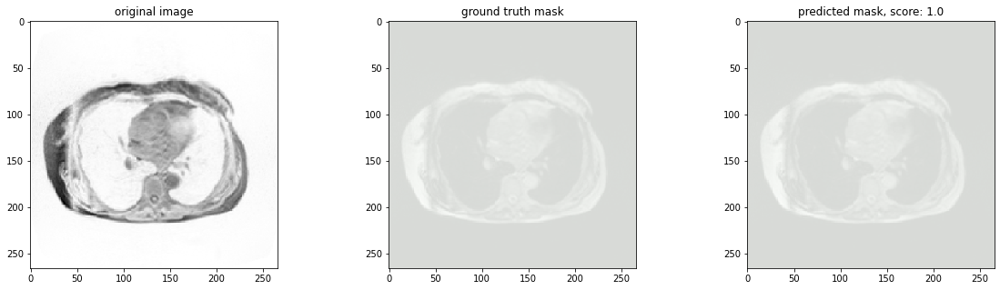

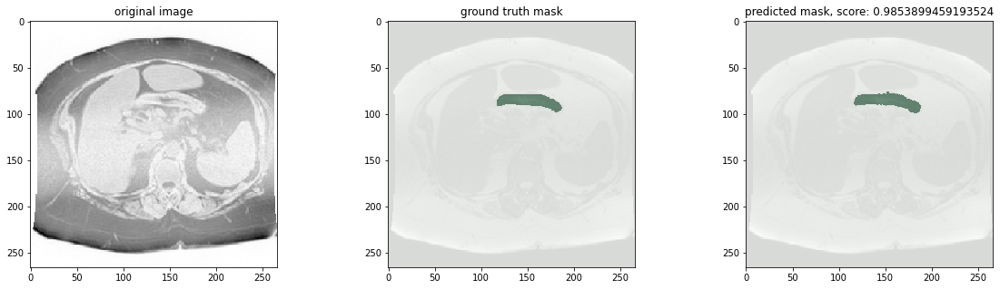

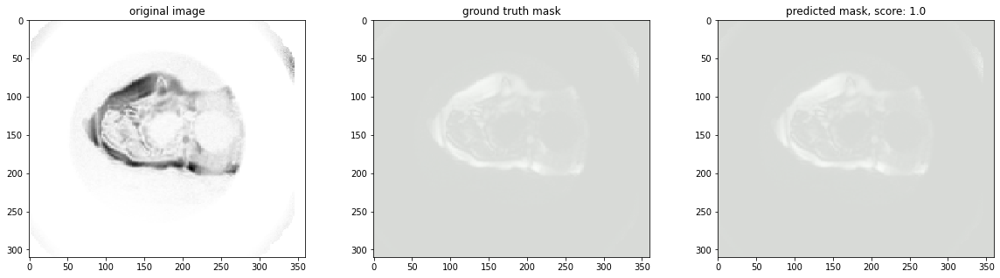

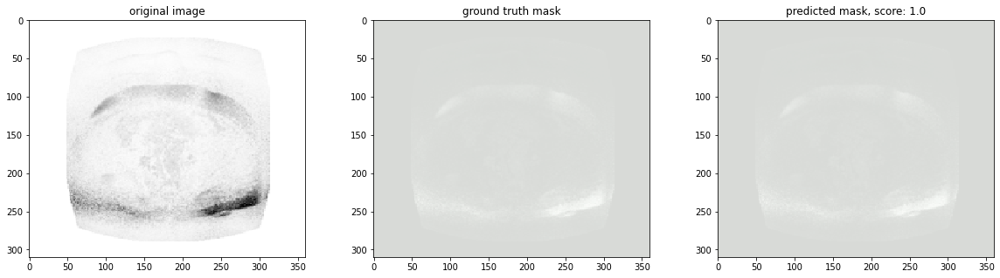

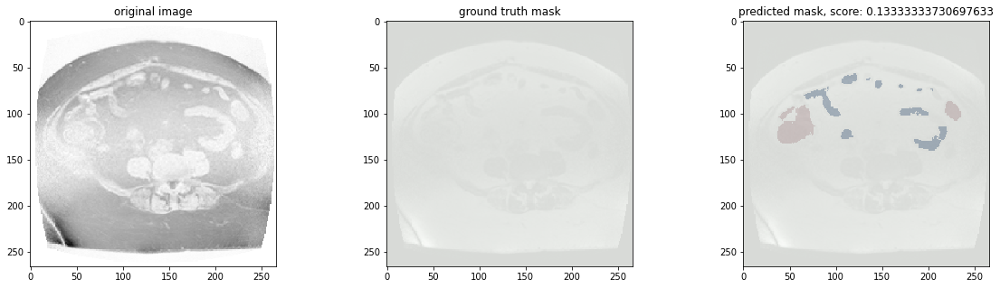

In [39]:
rand_idx = np.random.randint(0, len(eval_data)-1, 100)

scores = []

for i in rand_idx:
    h, w = eval_data_df.height[i], eval_data_df.width[i]

    image, gt_mask = eval_data[i]

    gt_mask = gt_mask.unsqueeze(dim=0)

    eval_sample = image.unsqueeze(dim=0).to(device)
    pred_mask = pipeline.model(eval_sample)

    #resize tensors appropriately
    image = image_resize(image, (h, w))
    gt_mask = image_resize(gt_mask, (h, w))
    pred_mask = image_resize(pred_mask, (h, w))

    #print(pred_mask.shape, gt_mask.shape)
    dice_score = pipeline.lossfunc.dice_coeff(pred_mask, gt_mask)

    hd = pipeline.lossfunc.hausdorff_distance(pred_mask, gt_mask)

    pred_score = (0.6 * (1 - hd)) + (0.4 * dice_score)
    scores.append(pred_score)

    gt_mask = gt_mask.squeeze()
    pred_mask = pred_mask.squeeze().round().detach().cpu()

    lb_gt_mask, sb_gt_mask, stomach_gt_mask = gt_mask
    lb_pred_mask, sb_pred_mask, stomach_pred_mask = pred_mask

    alpha = 0.5

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))
    axs[0].imshow(image.squeeze(), cmap='gray', interpolation='none')
    axs[0].set_title('original image')

    axs[1].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[1].imshow(lb_gt_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[1].imshow(sb_gt_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[1].imshow(stomach_gt_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[1].set_title('ground truth mask')

    axs[2].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[2].imshow(lb_pred_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[2].imshow(sb_pred_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[2].imshow(stomach_pred_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[2].set_title(f'predicted mask, score: {pred_score}')


scores = np.array(scores)
scores = scores[~(scores == 1)]
scores[scores < 0.4] = 0
print(f' final mean score is: {np.mean(scores)}')